In [1]:
# Import packages
import pandas as pd
pd.options.mode.chained_assignment = None
import numpy as np
import matplotlib.pyplot as plt

# Increase resolution of all matplotlib plots
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 600

In [2]:
# Read in cleaned data, neglecting index column
yelp_clean = pd.read_csv('../Data/yelp-clean.csv', low_memory=False).iloc[:, 1:]

In [3]:
# Look at value counts for each column
for col in yelp_clean.columns:
    print("------------ %s --------------" % col)
    print(yelp_clean[col].value_counts())

------------ name --------------
Starbucks                        982
McDonald's                       721
Subway Restaurants               536
Tim Hortons                      321
Burger King                      297
                                ... 
Mini Bluebird Montessori           1
Winter Accounting & Advising       1
Los Olivos Park                    1
J&S Automotive & Machine Shop      1
Value Check                        1
Name: name, Length: 135483, dtype: int64
------------ review_count --------------
3       30378
4       16209
5       12252
6        9802
7        8224
        ...  
828         1
1516        1
950         1
1914        1
2500        1
Name: review_count, Length: 1251, dtype: int64
------------ categories --------------
Nail Salons, Beauty & Spas                                                                                                                                                                                   915
Pizza, Restaurants           

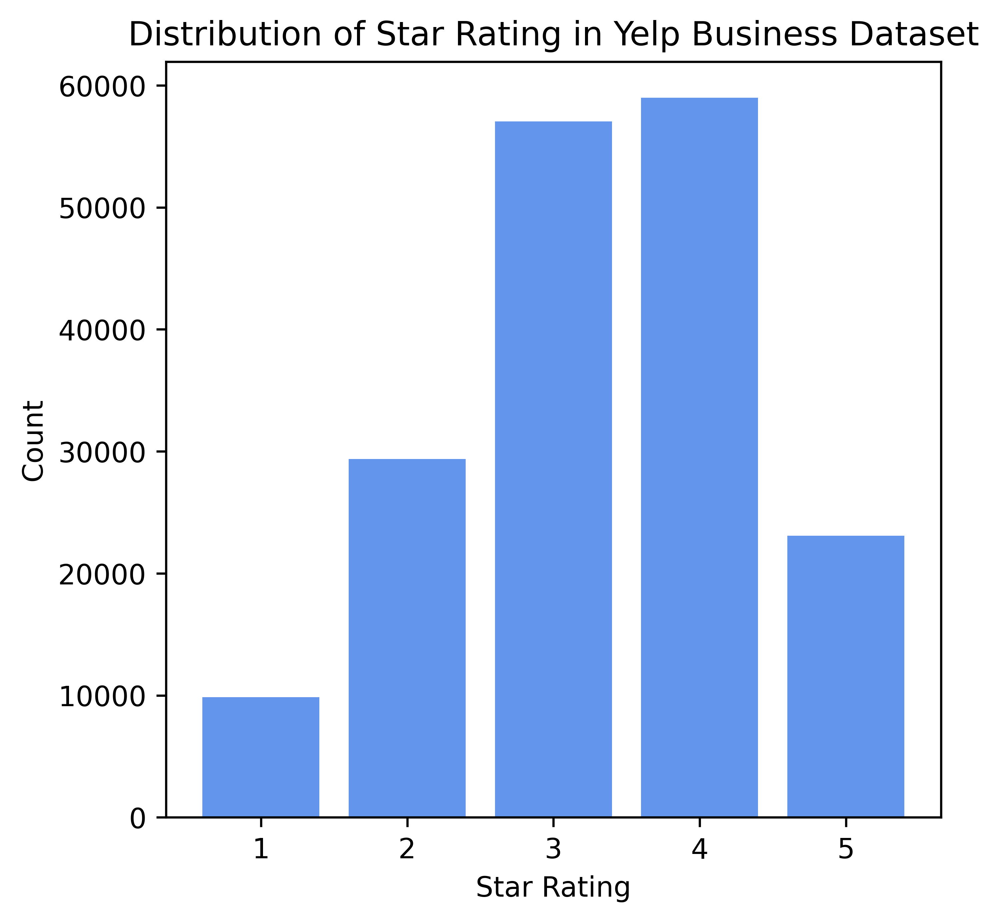

In [4]:
# Plot distribution of target variable
order = ['5.0', '4.5', '4.0', '3.5', '3.0', '2.5', '2.0', '1.5', '1.0']
yelp_clean['star-rating'].value_counts().sort_index().plot(kind='bar', figsize=(5,5), width=0.8, color="cornflowerblue")
plt.ylabel('Count')
plt.xlabel('Star Rating')
plt.title('Distribution of Star Rating in Yelp Business Dataset')
plt.xticks(rotation=0)
#plt.savefig('../Figures/bar-stars.png')
plt.show()

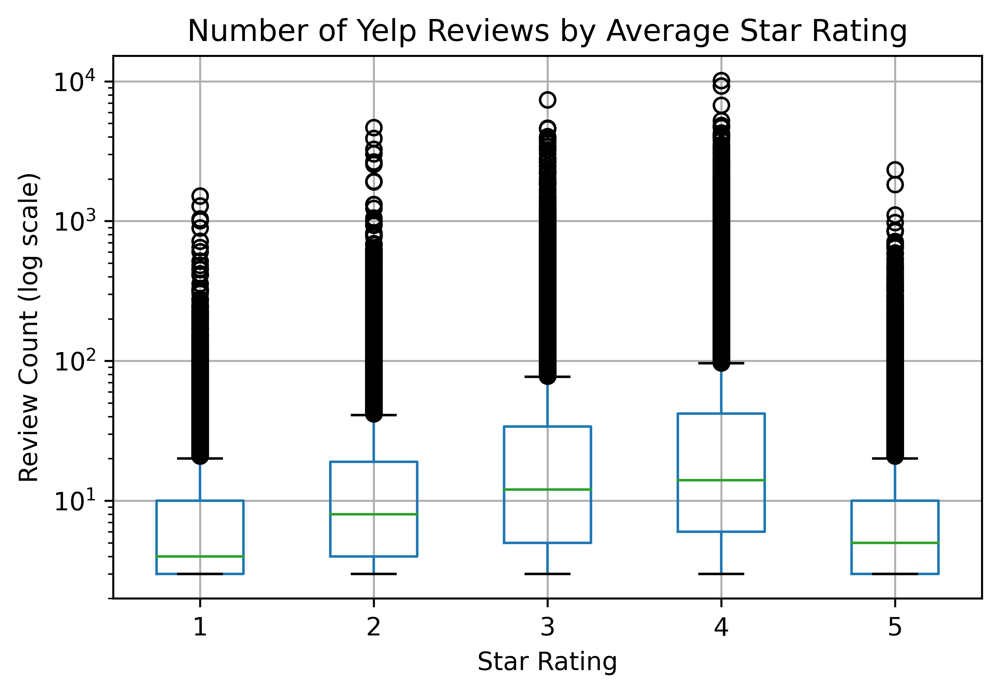

In [5]:
yelp_clean[['review_count','star-rating']].boxplot(by='star-rating')
plt.semilogy()
plt.ylabel('Review Count (log scale)')
plt.xlabel('Star Rating')
plt.title('Number of Yelp Reviews by Average Star Rating')
plt.suptitle('')
#plt.savefig('../Figures/review_count_boxplot.png')
plt.show()

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


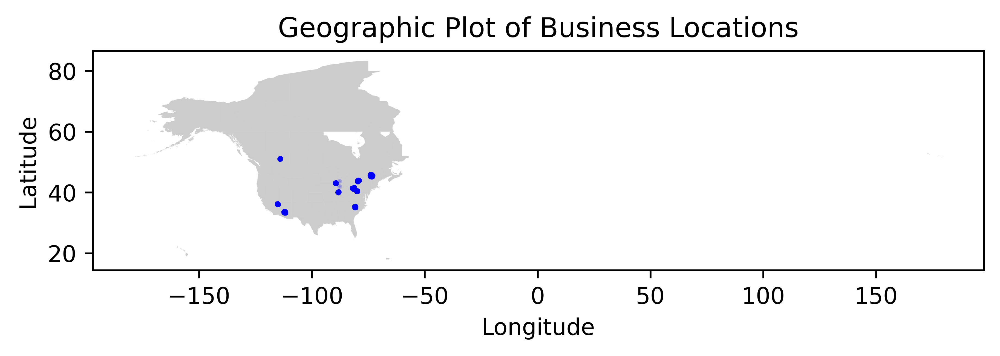

In [9]:
# Plot geographic points of business locations
import geopandas
from shapely.geometry import Point
# https://www.sciencebase.gov/catalog/item/51bf5940e4b0eb321c798ec9
# https://towardsdatascience.com/geopandas-101-plot-any-data-with-a-latitude-and-longitude-on-a-map-98e01944b972
geom = [Point(xy) for xy in zip(yelp_clean['longitude'], yelp_clean['latitude'])]
loc_map = geopandas.read_file('../Data/USA_Canada_ShapefileMerge.zip')
crs = {'init': 'epsg:4326'}
geo_df = geopandas.GeoDataFrame(yelp_clean, crs=crs, geometry=geom)
fig,ax = plt.subplots(figsize = (7,7))
loc_map.plot(ax=ax, alpha=0.4, color="grey")
geo_df.plot(ax=ax, markersize=1, color="blue", marker="o", alpha=0.2)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Geographic Plot of Business Locations')
#plt.savefig('../Figures/NA_map.png')
plt.show()

2       53571
1       30416
3        9122
4        1964
None       94
Name: attributes.RestaurantsPriceRange2, dtype: int64


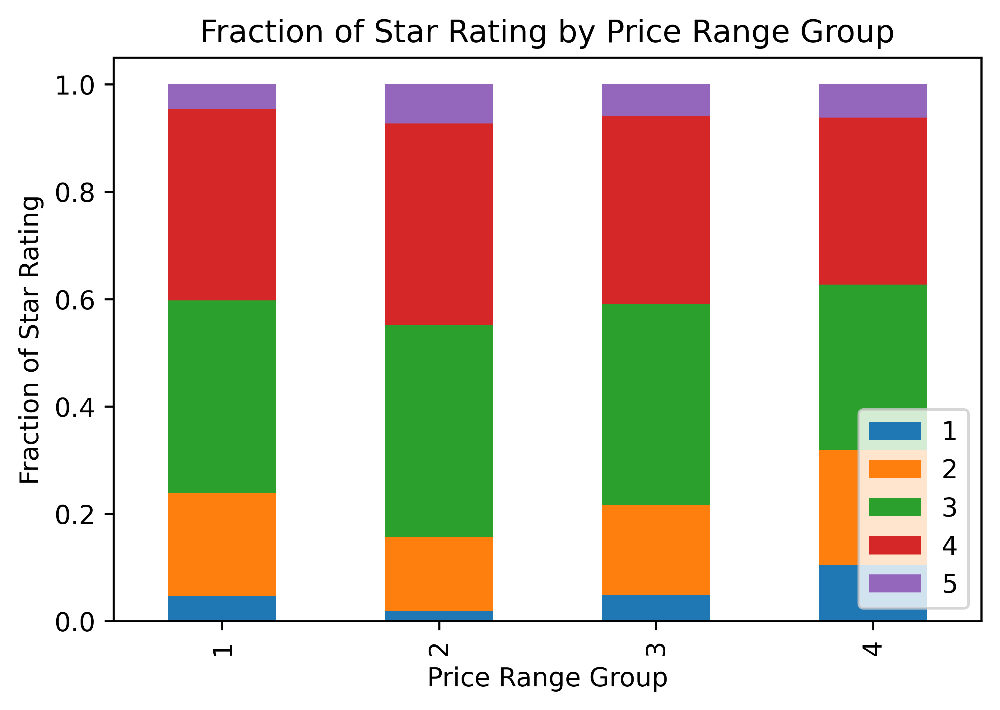

In [10]:
# Plot price range vs. star rating
print(yelp_clean['attributes.RestaurantsPriceRange2'].value_counts())
# Remove None values, create new df; code from EDApt2
price_df = yelp_clean[yelp_clean['attributes.RestaurantsPriceRange2']!='None']
count_matrix = price_df.groupby(['attributes.RestaurantsPriceRange2', 'star-rating']).size().unstack()
count_matrix_norm = count_matrix.div(count_matrix.sum(axis=1),axis=0)
#print(count_matrix_norm)
count_matrix_norm.plot(kind='bar', stacked=True)
plt.ylabel('Fraction of Star Rating')
plt.xlabel('Price Range Group')
plt.title('Fraction of Star Rating by Price Range Group')
plt.legend(loc=4)
#plt.savefig('../Figures/price-stacked-bar.png')
plt.show()

In [11]:
import missingno as msno
msno.matrix(yelp_clean)
plt.title('Missing Values in Each Feature', fontdict = {'fontsize' : 30})
#plt.savefig('../Figures/missing-values.png', bbox_inches='tight')
plt.show()

In [12]:
msno.heatmap(yelp_clean)
plt.title('Missingness Correlations', fontdict = {'fontsize' : 30})
#plt.savefig('../Figures/missingness-correlation-heatmap.png', bbox_inches='tight')
plt.show()